** Setting up the library **

The library is currently available in the github repository  . In order to run it it is necesary to install 'bio.tilling' from the repository. 

In [1]:
#install.packages("devtools")
library("devtools")
devtools::install_github("homonecloco/bio.tilling")

Installing bio.tilling
'/Library/Frameworks/R.framework/Resources/bin/R' --no-site-file --no-environ  \
  --no-save --no-restore CMD INSTALL  \
  '/private/var/folders/nm/r68pwf8s32v8rl9gzv_wpf10pl0s2v/T/Rtmp9yrQFL/devtools2a84db02606/homonecloco-bio.tilling-fcd696f'  \
  --library='/Users/ramirezr/library/R/3.2/library' --install-tests 



NOTE: The functions declared in this workbook will be added to the package, so they won't be needed in the future, and the document will be upldated accordingly

In [2]:

require('bio.tilling')

Loading required package: bio.tilling


The first step is to read the table containging the raw coverage for all the exons to analyse. The ID of each row must be in the format: 'scaffold:start:end'. This is required as the region is subsequently parsed. The function 'readCoverageTable' reads the table and removes empty rows and exons where all the samples have a coverage of 0.

In [3]:
filename<-'input_example/Chromosome2BTest.tab'
covs<-readCoverageTable(filename)
head(covs)

,LIB11222_Cadenza0100,LIB10289_Cadenza0104,LIB10920_Cadenza0105,LIB10929_Cadenza0106,LIB10963_Cadenza0107,LIB11399_Cadenza0108,LIB11208_Cadenza0111,LIB11226_Cadenza0112,LIB10306_Cadenza0116,LIB10921_Cadenza0117,ellip.h,LIB11494_Control,LIB11495_Control,LIB11490_Control,LIB11491_Control,LIB10702_Control,LIB10704_Control,LIB10705_Control,LIB10706_Control,LIB5782_Control,LIB8440_Control
IWGSC_CSS_2BL_scaff_636814:5559:6078,200,109,222,185,154,138,128,167,123,176,⋯,250,233,302,247,136,108,155,100,200,39
IWGSC_CSS_2BL_scaff_636814:6165:6283,86,46,72,46,72,48,61,60,45,47,⋯,105,71,89,77,43,41,54,72,63,21
IWGSC_CSS_2BL_scaff_636814:6524:6689,164,78,159,131,97,125,104,123,90,121,⋯,227,184,269,209,122,95,139,89,303,49
IWGSC_CSS_2BL_scaff_636814:6787:6916,87,68,108,97,91,74,83,90,75,63,⋯,122,125,176,130,92,80,92,80,100,29
IWGSC_CSS_2BL_scaff_636814:7005:7099,155,104,160,132,116,86,88,136,94,101,⋯,172,169,280,189,107,128,137,117,71,40
IWGSC_CSS_2BL_scaff_636814:7207:7393,140,74,149,118,93,100,85,145,105,96,⋯,175,166,246,162,116,87,101,121,172,46


The next step is to filter out the samples with high variability. The default maximum standard deviation across the sample is of 0.3, with the values normalized to have an average coverage per exon of 1.  

In [4]:
ncol(covs)


[1] 489

In [5]:
covs<-filterSamplesPerSD(covs, maxSD=0.3)
ncol(covs)

[1] 445

The next step is to parse the name of each used row to get the scaffold, start, end and the exon length

In [6]:
df<-getExonsDF(covs)
head(df)

,Exon,Scaffold,Start,Ends,ExonL,sdExon
IWGSC_CSS_2BL_scaff_636814:5559:6078,IWGSC_CSS_2BL_scaff_636814:5559:6078,IWGSC_CSS_2BL_scaff_636814,5559,6078,519,45.28864
IWGSC_CSS_2BL_scaff_636814:6165:6283,IWGSC_CSS_2BL_scaff_636814:6165:6283,IWGSC_CSS_2BL_scaff_636814,6165,6283,118,16.6804
IWGSC_CSS_2BL_scaff_636814:6524:6689,IWGSC_CSS_2BL_scaff_636814:6524:6689,IWGSC_CSS_2BL_scaff_636814,6524,6689,165,37.08518
IWGSC_CSS_2BL_scaff_636814:6787:6916,IWGSC_CSS_2BL_scaff_636814:6787:6916,IWGSC_CSS_2BL_scaff_636814,6787,6916,129,27.03575
IWGSC_CSS_2BL_scaff_636814:7005:7099,IWGSC_CSS_2BL_scaff_636814:7005:7099,IWGSC_CSS_2BL_scaff_636814,7005,7099,94,37.41357
IWGSC_CSS_2BL_scaff_636814:7207:7393,IWGSC_CSS_2BL_scaff_636814:7207:7393,IWGSC_CSS_2BL_scaff_636814,7207,7393,186,33.64114


Then, we normalize the coverage so each exon has a mean of 1. 

In [7]:
mat<-normalizeCovs(covs, df)
head(mat)

,LIB11222_Cadenza0100,LIB10289_Cadenza0104,LIB10920_Cadenza0105,LIB10929_Cadenza0106,LIB10963_Cadenza0107,LIB11399_Cadenza0108,LIB11208_Cadenza0111,LIB11226_Cadenza0112,LIB10306_Cadenza0116,LIB10921_Cadenza0117,ellip.h,LIB11492_Control,LIB11493_Control,LIB11494_Control,LIB11495_Control,LIB11490_Control,LIB11491_Control,LIB10702_Control,LIB10704_Control,LIB10705_Control,LIB10706_Control
IWGSC_CSS_2BL_scaff_636814:5559:6078,1.079639,0.9146812,1.077298,1.160642,1.097451,0.8997595,1.108453,1.031059,0.9823628,1.087051,⋯,1.091472,0.9525973,0.9703872,0.9847083,0.9913939,1.064315,1.008098,0.8500118,1.067538,0.7976962
IWGSC_CSS_2BL_scaff_636814:6165:6283,1.295162,1.076907,0.9747479,0.8051212,1.431442,0.8731034,1.473718,1.033464,1.002666,0.8098643,⋯,1.018955,1.093118,1.137029,0.8371188,0.8150915,0.9256374,0.8892206,0.9002479,1.037582,1.602312
IWGSC_CSS_2BL_scaff_636814:6524:6689,1.129572,0.8351405,0.9844679,1.048623,0.8819779,1.03987,1.149112,0.9689332,0.9171303,0.9535521,⋯,0.9645418,1.082423,1.124223,0.9921817,1.126713,1.149056,1.15384,0.9539959,1.221485,0.9058354
IWGSC_CSS_2BL_scaff_636814:6787:6916,0.8080711,0.9818249,0.9017546,1.04708,1.115803,0.8301584,1.236709,0.9560738,1.030647,0.6695142,⋯,0.7891962,0.915392,0.8147921,0.9089575,0.9941087,0.9638253,1.173367,1.083361,1.090238,1.098018
IWGSC_CSS_2BL_scaff_636814:7005:7099,0.9986671,1.041639,0.926709,0.9884187,0.9866495,0.669247,0.9095587,1.002182,0.8960564,0.7445595,⋯,0.9935187,0.918159,0.7968456,0.8524698,1.097079,0.9720208,0.9466478,1.202408,1.126193,1.113946
IWGSC_CSS_2BL_scaff_636814:7207:7393,1.024577,0.8418661,0.9802505,1.003636,0.8984942,0.883925,0.9979169,1.213677,1.136905,0.803853,⋯,1.007594,1.111134,0.9208972,0.9511035,1.094819,0.9463595,1.165709,0.9283003,0.9430635,1.308552


We remove the original table of coverages to reduce the memory footprint

In [8]:
rm(covs)

We filter the exons with high variation (with a standard deviation over 0.3) and we parse again the row names to have a dataframe only with the selected exons. Note that the "sdExon" column, containing the standard deviation of each exon, now reflect the normalized values. 

In [9]:
nrow(mat)

[1] 10081

In [10]:
mat<-filterLowQualityExons(mat, maxSD=0.3)
df<-getExonsDF(mat)
nrow(mat)

[1] 7653

In [11]:
head(df)

,Exon,Scaffold,Start,Ends,ExonL,sdExon
IWGSC_CSS_2BL_scaff_636814:5559:6078,IWGSC_CSS_2BL_scaff_636814:5559:6078,IWGSC_CSS_2BL_scaff_636814,5559,6078,519,0.129808
IWGSC_CSS_2BL_scaff_636814:6165:6283,IWGSC_CSS_2BL_scaff_636814:6165:6283,IWGSC_CSS_2BL_scaff_636814,6165,6283,118,0.2025156
IWGSC_CSS_2BL_scaff_636814:6524:6689,IWGSC_CSS_2BL_scaff_636814:6524:6689,IWGSC_CSS_2BL_scaff_636814,6524,6689,165,0.1358607
IWGSC_CSS_2BL_scaff_636814:6787:6916,IWGSC_CSS_2BL_scaff_636814:6787:6916,IWGSC_CSS_2BL_scaff_636814,6787,6916,129,0.1765368
IWGSC_CSS_2BL_scaff_636814:7005:7099,IWGSC_CSS_2BL_scaff_636814:7005:7099,IWGSC_CSS_2BL_scaff_636814,7005,7099,94,0.1713981
IWGSC_CSS_2BL_scaff_636814:7207:7393,IWGSC_CSS_2BL_scaff_636814:7207:7393,IWGSC_CSS_2BL_scaff_636814,7207,7393,186,0.1734013


Then we categorize each exon as deleted or not deleted. The resulting dataframe only include the exons with a putative deletion. 
The columns are the following: 
* **Exon** The name of the exon from the matrix
* **Library** The library where the deletion appears. 
* **NormCov** The normalized coverage of the library in the given exon. 
* **HomDel** Homozygous deletion, the normalized coverage is less than 0.1
* **HetDel1** Heterozygous deletion, the Normalized Coverage is less than 0.5 + sdExon
* **Scaffold** The scaffold where the exon is located
* **Start** Starting positionof the exon

To consider anything as a deletion, the value must also be below 1 - sdLibrary (standard deviation in the library). We get that value later on to be able to plot those cases.

In [12]:
dels<-getAllDeletedExons(mat,df)
head(dels)

,Exon,Library,NormCov,HomDel,HetDel1,Scaffold,Start
135,IWGSC_CSS_2BL_scaff_6521114:16953:17067,LIB11222_Cadenza0100,0.7314991,FALSE,TRUE,IWGSC_CSS_2BL_scaff_6521114,16953
205,IWGSC_CSS_2BL_scaff_7910419:3047:3175,LIB11222_Cadenza0100,0.7062092,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7910419,3047
236,IWGSC_CSS_2BL_scaff_7932617:5933:5973,LIB11222_Cadenza0100,0.7025895,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7932617,5933
414,IWGSC_CSS_2BL_scaff_7940099:806:865,LIB11222_Cadenza0100,0.7817671,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7940099,806
460,IWGSC_CSS_2BL_scaff_7943058:11135:11256,LIB11222_Cadenza0100,0.6050065,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7943058,11135
462,IWGSC_CSS_2BL_scaff_7943058:12501:12655,LIB11222_Cadenza0100,0.7134812,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7943058,12501


We get the standard deviation of each library, to be able to plot them

In [13]:
libSD<-getLibSD(mat)
head(libSD)

LIB11222_Cadenza0100 LIB10289_Cadenza0104 LIB10920_Cadenza0105 
           0.1502336            0.1611375            0.1353060 
LIB10929_Cadenza0106 LIB10963_Cadenza0107 LIB11399_Cadenza0108 
           0.1525334            0.1390661            0.1592261

Then we want to identify which scaffolds have deletions and how many of the exons have a deletion. 

In [14]:
scaffsWithDels<-getAllScaffoldsWithDeletions(df,dels)
head(scaffsWithDels)

Loading required package: gsubfn
Loading required package: proto
Loading required package: RSQLite
Loading required package: DBI
Loading required package: tcltk


,Scaffold,Library,validExons,HetDels,HomDels
1,IWGSC_CSS_2BL_scaff_1218769,LIB10289_Cadenza0104,11,1,0
2,IWGSC_CSS_2BL_scaff_1218769,LIB10946_Cadenza0142,11,1,0
3,IWGSC_CSS_2BL_scaff_1218769,LIB10681_Cadenza0156,11,1,0
4,IWGSC_CSS_2BL_scaff_1218769,LIB10953_Cadenza0166,11,1,0
5,IWGSC_CSS_2BL_scaff_1218769,LIB10612_Cadenza0290,11,1,0
6,IWGSC_CSS_2BL_scaff_1218769,LIB10668_Cadenza0297,11,1,0


To get a better idea of how the deletions are behaving, we calculate more statistics for each exon. The stats are calculated for every exon, regardless of it having a deletion or not. 
For each library several counts, averages and standard deviations are calculated. The criteria to include an exon in the agregated category are the following. :

* **All** All the exons in a scaffold 
* **NoHom** Exons that have a coverage >  0.1
* **No3SigmaDel** Exons that have a coverage > 1-3 * sdExon
* **NoHet** Exons that have a coverage > 0.5 + sdExon
* **Het** Exons that have a coverage < 0.5 + sdExon 
* **Hom** Exons that have a coverage < 0.1 
Note that the categories are not exclusive. 

This routine takes around 24 hours to run in 455 lines on hexaploid wheat. To monitor the progress a progress bar is displayed. If you don't want to show the progress bar (using on a cluster without X11), you can add the argument: showProgressBar = F

In [15]:
#deslWithAVGs<-getAllScaffoldAverages(scaffsWithDels, mat,df)
deslWithAVGs<-getAllScaffoldAveragesParallel(scaffsWithDels, mat,df, cores=4)
head(deslWithAVGs)

,Scaffold,Library,AllCount,AllAvg,AllSD,NoHomCount,NoHomAvg,NoHomSD,No3SigmaDelCount,No3SigmaDelAvg,ellip.h,NoHetCount,NoHetAvg,NoHetSD,HetCount,HetAvg,HetSD,HomCount,HomAvg,HomSD,Score
1,IWGSC_CSS_2BL_scaff_1218769,LIB10289_Cadenza0104,11,0.970093,0.1473714,11,0.970093,0.1473714,11,0.970093,⋯,11,0.970093,0.1473714,0,NaN,NA,0,NaN,NA,0
2,IWGSC_CSS_2BL_scaff_1218769,LIB10946_Cadenza0142,11,0.9215476,0.1567904,11,0.9215476,0.1567904,11,0.9215476,⋯,10,0.9554886,0.1150424,1,0.582137,NA,0,NaN,NA,0.09090909
3,IWGSC_CSS_2BL_scaff_1218769,LIB10681_Cadenza0156,11,1.100283,0.1849047,11,1.100283,0.1849047,11,1.100283,⋯,10,1.14644,0.1093149,1,0.6387145,NA,0,NaN,NA,0.09090909
4,IWGSC_CSS_2BL_scaff_1218769,LIB10953_Cadenza0166,11,0.9246237,0.1424437,11,0.9246237,0.1424437,11,0.9246237,⋯,11,0.9246237,0.1424437,0,NaN,NA,0,NaN,NA,0
5,IWGSC_CSS_2BL_scaff_1218769,LIB10612_Cadenza0290,11,1.007948,0.2357554,11,1.007948,0.2357554,10,1.049617,⋯,10,1.049617,0.2013321,1,0.5912574,NA,0,NaN,NA,0.1
6,IWGSC_CSS_2BL_scaff_1218769,LIB10668_Cadenza0297,11,1.026143,0.2673057,11,1.026143,0.2673057,11,1.026143,⋯,10,1.082362,0.2018961,1,0.4639515,NA,0,NaN,NA,0.09090909


In [16]:
getAllScaffoldAveragesParallel

function (delsMat, localMat, exonsDF, cores = 2) 
{
    library(parallel)
    total <- nrow(delsMat)
    cl <- makeForkCluster(nnodes = cores)
    result <- parSapply(cl, 1:total, getScaffoldAveragesByIndex, 
        delsMat, localMat, exonsDF)
    df <- data.frame(t(result), stringsAsFactors = FALSE)
    df[, 3:21] <- sapply(df[, 3:21], as.numeric)
    stopCluster(cl)
    df
}
<environment: namespace:bio.tilling>

In [17]:
nrow(deslWithAVGs)

[1] 65945

To get a single value that can be used to filter the following score is used:

score=HetCount/No3SigmaDelCount

Since all the HetCount are also HomCount, the formula works to highlight the cases where there are more putative deleted exons than non-deleted exons.  


In [18]:
delsWithScores <- deslWithAVGs
head(delsWithScores)

,Scaffold,Library,AllCount,AllAvg,AllSD,NoHomCount,NoHomAvg,NoHomSD,No3SigmaDelCount,No3SigmaDelAvg,ellip.h,NoHetCount,NoHetAvg,NoHetSD,HetCount,HetAvg,HetSD,HomCount,HomAvg,HomSD,Score
1,IWGSC_CSS_2BL_scaff_1218769,LIB10289_Cadenza0104,11,0.970093,0.1473714,11,0.970093,0.1473714,11,0.970093,⋯,11,0.970093,0.1473714,0,NaN,NA,0,NaN,NA,0
2,IWGSC_CSS_2BL_scaff_1218769,LIB10946_Cadenza0142,11,0.9215476,0.1567904,11,0.9215476,0.1567904,11,0.9215476,⋯,10,0.9554886,0.1150424,1,0.582137,NA,0,NaN,NA,0.09090909
3,IWGSC_CSS_2BL_scaff_1218769,LIB10681_Cadenza0156,11,1.100283,0.1849047,11,1.100283,0.1849047,11,1.100283,⋯,10,1.14644,0.1093149,1,0.6387145,NA,0,NaN,NA,0.09090909
4,IWGSC_CSS_2BL_scaff_1218769,LIB10953_Cadenza0166,11,0.9246237,0.1424437,11,0.9246237,0.1424437,11,0.9246237,⋯,11,0.9246237,0.1424437,0,NaN,NA,0,NaN,NA,0
5,IWGSC_CSS_2BL_scaff_1218769,LIB10612_Cadenza0290,11,1.007948,0.2357554,11,1.007948,0.2357554,10,1.049617,⋯,10,1.049617,0.2013321,1,0.5912574,NA,0,NaN,NA,0.1
6,IWGSC_CSS_2BL_scaff_1218769,LIB10668_Cadenza0297,11,1.026143,0.2673057,11,1.026143,0.2673057,11,1.026143,⋯,10,1.082362,0.2018961,1,0.4639515,NA,0,NaN,NA,0.09090909


In [19]:
selectedDels<-delsWithScores[delsWithScores$Score>=1,]
head(selectedDels)

,Scaffold,Library,AllCount,AllAvg,AllSD,NoHomCount,NoHomAvg,NoHomSD,No3SigmaDelCount,No3SigmaDelAvg,ellip.h,NoHetCount,NoHetAvg,NoHetSD,HetCount,HetAvg,HetSD,HomCount,HomAvg,HomSD,Score
52,IWGSC_CSS_2BL_scaff_1218769,LIB10293_Cadenza1498,11,0.03587942,0.05085242,2,0.1278629,0.02711717,0,NaN,⋯,0,NaN,NA,11,0.03587942,0.05085242,9,0.01543864,0.0235637,Inf
237,IWGSC_CSS_2BL_scaff_1810970,LIB11411_Cadenza2072,18,0.5547104,0.08830682,18,0.5547104,0.08830682,10,0.5945799,⋯,2,0.6617208,0.0451909,16,0.5413341,0.08357038,0,NaN,NA,1.6
462,IWGSC_CSS_2BL_scaff_3869475,LIB10293_Cadenza1498,15,0.008890191,0.01052801,0,NaN,NA,0,NaN,⋯,0,NaN,NA,15,0.008890191,0.01052801,15,0.008890191,0.01052801,Inf
609,IWGSC_CSS_2BL_scaff_3918507,LIB10293_Cadenza1498,18,0.02098053,0.04172354,1,0.1698606,NA,0,NaN,⋯,0,NaN,NA,18,0.02098053,0.04172354,17,0.01222287,0.0195662,Inf
947,IWGSC_CSS_2BL_scaff_6521114,LIB10293_Cadenza1498,12,0.06869958,0.1275559,3,0.2437031,0.1647789,2,0.2741751,⋯,0,NaN,NA,12,0.06869958,0.1275559,9,0.01036506,0.01645657,6
1083,IWGSC_CSS_2BL_scaff_6692662,LIB11440_Cadenza0654,10,0.6069423,0.1229775,10,0.6069423,0.1229775,6,0.6778476,⋯,2,0.8027925,0.03684027,8,0.5579797,0.0745086,0,NaN,NA,1.333333


In [20]:
nrow(selectedDels)

[1] 201

We can plot the coverage on specific scaffolds to see if the putative deletion is consistent and how variable the involved exons are. The labels in the plot includes:
    
* The line being ploted
* A box plot representing the variation across the exon
* The gray wiskers shos the 3Sigma limit
* The dots in the plot of the coverage in the line highlight if it was called a deletion or not, and the reason. 
* **Max. for Het** is the threshold for heterozygous deletions (0.5 + sdExon)

Warning message:
: package ‘ggplot2’ was built under R version 3.2.3

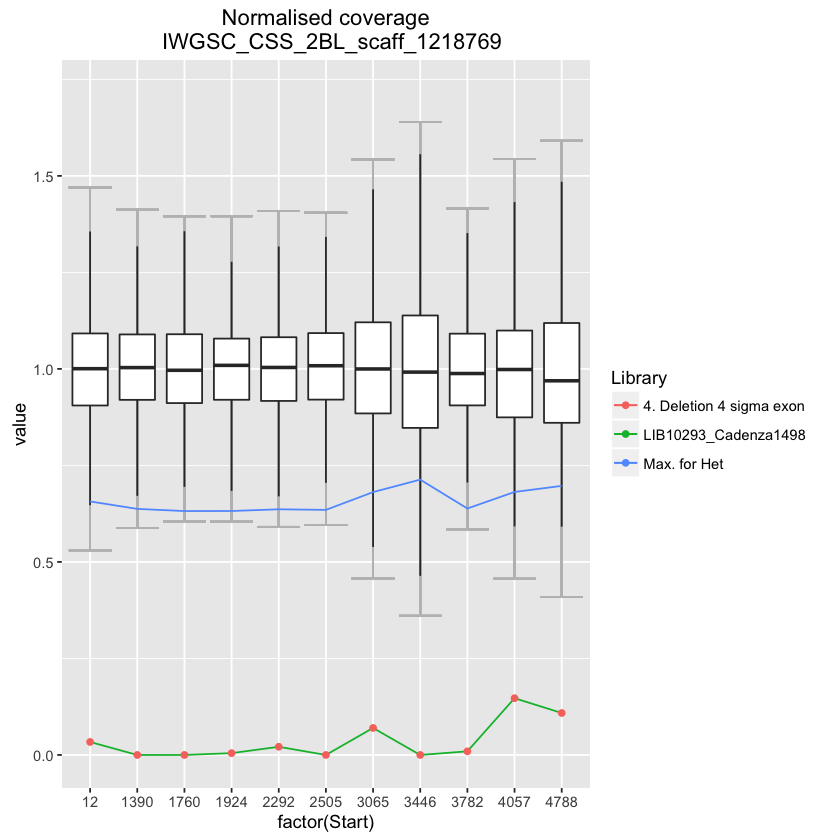

In [21]:
plotLibraryOnScaffold("IWGSC_CSS_2BL_scaff_1218769","LIB10293_Cadenza1498", df,mat, delsWithAvs, libSD)

Scaffold IWGSC_CSS_2BL_scaff_7939376 has a small deletion within on library LIB10929_Cadenza0106. We haven't tested this kind of deletions as we didn't have plant material on the few that we have identified. 

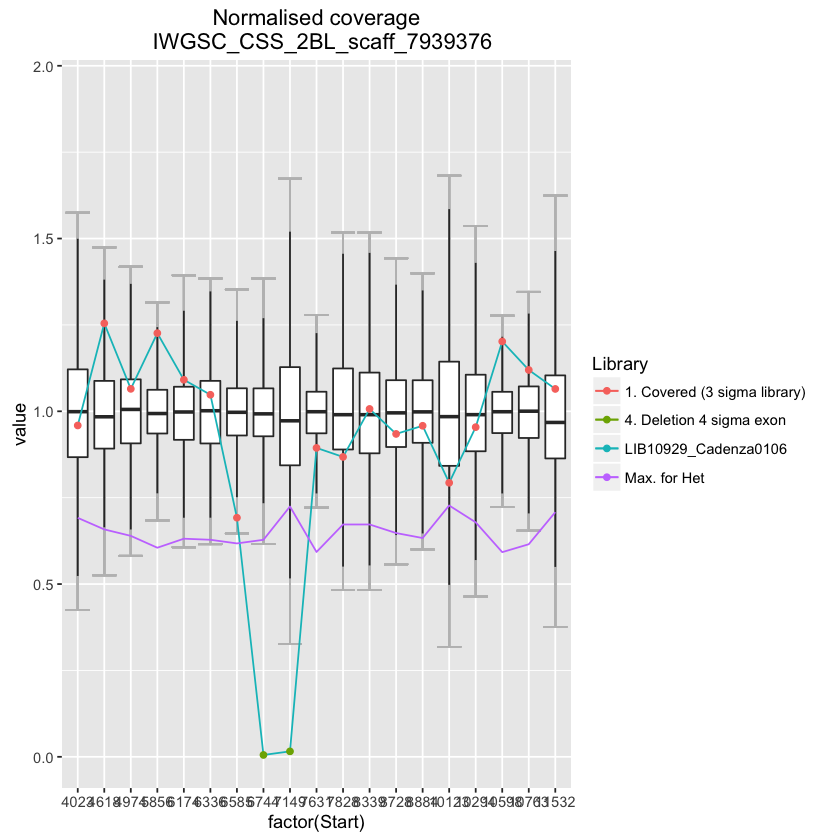

In [22]:

plotLibraryOnScaffold("IWGSC_CSS_2BL_scaff_7939376","LIB10929_Cadenza0106", df,mat, delsWithAvs, libSD)

In order to get the positions of the deletions within the chromosome we can load a genetic map with the positions of the scaffolds. 

In [23]:
geneticMap<-read.csv('input_example/chapman2BIWGSC.csv', header=T)
head(geneticMap)

,contig,chr,cM
1,IWGSC_CSS_1BS_scaff_1529189,2B,0
2,IWGSC_CSS_1BS_scaff_3436781,2B,0
3,IWGSC_CSS_2BS_scaff_1085238,2B,0
4,IWGSC_CSS_2BS_scaff_1172235,2B,0
5,IWGSC_CSS_2BS_scaff_1172260,2B,0
6,IWGSC_CSS_2BS_scaff_1265247,2B,0


Function to select the genetic map 

In [24]:
tableWithAllDels <- getDeletionsPerCM(geneticMap,selectedDels, mat)

In [25]:
head(tableWithAllDels)

,chr,cM,ScaffoldCount,Library,HetDels,HomDels,hetDelsPer,homDelsPer
1,2B,0,4,LIB11222_Cadenza0100,0,0,0,0
2,2B,0,4,LIB10289_Cadenza0104,0,0,0,0
3,2B,0,4,LIB10920_Cadenza0105,0,0,0,0
4,2B,0,4,LIB10929_Cadenza0106,0,0,0,0
5,2B,0,4,LIB10963_Cadenza0107,0,0,0,0
6,2B,0,4,LIB11399_Cadenza0108,0,0,0,0


In [26]:
tableWithAllDels[tableWithAllDels$chr == "2B" & tableWithAllDels$Library == "LIB10293_Cadenza1498",]

,chr,cM,ScaffoldCount,Library,HetDels,HomDels,hetDelsPer,homDelsPer
278,2B,0,4,LIB10293_Cadenza1498,0,0,0,0
723,2B,6.832,1,LIB10293_Cadenza1498,0,0,0,0
1168,2B,13.658,1,LIB10293_Cadenza1498,0,0,0,0
1613,2B,15.931,6,LIB10293_Cadenza1498,0,0,0,0
2058,2B,17.067,2,LIB10293_Cadenza1498,0,0,0,0
2503,2B,19.34,2,LIB10293_Cadenza1498,0,0,0,0
2948,2B,20.4775,1,LIB10293_Cadenza1498,0,0,0,0
3393,2B,23.8885,1,LIB10293_Cadenza1498,0,0,0,0
3838,2B,33.023,4,LIB10293_Cadenza1498,0,0,0,0
4283,2B,34.16,1,LIB10293_Cadenza1498,0,0,0,0


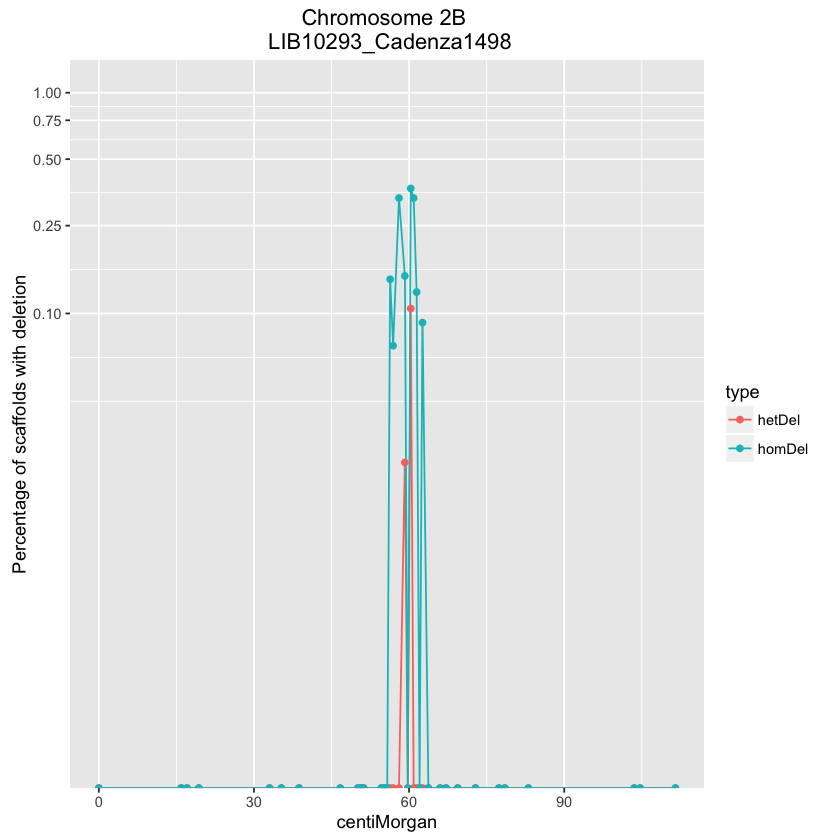

In [27]:
plotDeletionsInScaffold(tableWithAllDels,"2B","LIB10293_Cadenza1498")

In [28]:
ls()

[1] "dels"             "delsWithScores"   "deslWithAVGs"     "df"              
 [5] "filename"         "geneticMap"       "libSD"            "mat"             
 [9] "scaffsWithDels"   "selectedDels"     "tableWithAllDels"

In [29]:
write.csv(dels, file="dels.csv")
#'dels' 'delsWithScores' 'deslWithAVGs' 'df' 'filename' 'geneticMap' 'libSD' 'mat' 'scaffsWithDels' 'selectedDels' 'tableWithAllDels'

In [30]:
?write.table

write.table {utils},R Documentation
x,"the object to be written, preferably a matrix or data frame. If not, it is attempted to coerce x to a data frame."
file,"either a character string naming a file or a connection open for writing. """" indicates output to the console."
append,"logical. Only relevant if file is a character string. If TRUE, the output is appended to the file. If FALSE, any existing file of the name is destroyed."
quote,"a logical value (TRUE or FALSE) or a numeric vector. If TRUE, any character or factor columns will be surrounded by double quotes. If a numeric vector, its elements are taken as the indices of columns to quote. In both cases, row and column names are quoted if they are written. If FALSE, nothing is quoted."
sep,the field separator string. Values within each row of x are separated by this string.
eol,"the character(s) to print at the end of each line (row). For example, eol = ""\r\n"" will produce Windows' line endings on a Unix-alike OS, and eol = ""\r"" will produce files as expected by Excel:mac 2004."
na,the string to use for missing values in the data.
dec,the string to use for decimal points in numeric or complex columns: must be a single character.
row.names,"either a logical value indicating whether the row names of x are to be written along with x, or a character vector of row names to be written."
col.names,"either a logical value indicating whether the column names of x are to be written along with x, or a character vector of column names to be written. See the section on ‘CSV files’ for the meaning of col.names = NA."


In [31]:
nrow(selectedDels)

[1] 201